In [1]:
import cv2
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from utils import *
import os

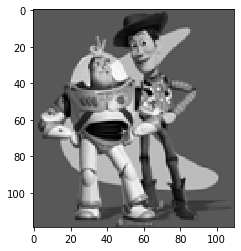

In [19]:
toy_img = cv2.cvtColor(cv2.imread('samples/toy_problem.png'), cv2.COLOR_BGR2RGB)
toy_img = cv2.cvtColor(toy_img, cv2.COLOR_BGR2GRAY).astype('double') / 255.0
plt.imshow(toy_img, cmap="gray")

## Part 1 Toy Problem (20 pts)

In [20]:
im_h, im_w = toy_img.shape

In [21]:
im2var = np.arange(im_h * im_w).reshape(im_h, im_w)


In [22]:
im2var

array([[    0,     1,     2, ...,   107,   108,   109],
       [  110,   111,   112, ...,   217,   218,   219],
       [  220,   221,   222, ...,   327,   328,   329],
       ...,
       [12760, 12761, 12762, ..., 12867, 12868, 12869],
       [12870, 12871, 12872, ..., 12977, 12978, 12979],
       [12980, 12981, 12982, ..., 13087, 13088, 13089]])

In [2]:
from scipy.sparse import csc_matrix
from scipy.sparse.linalg import lsqr
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import lsmr
from scipy.sparse import lil_matrix

In [53]:
def toy_reconstruct(img):
    """
    The implementation for gradient domain processing is not complicated, but it is easy to make a mistake, so let's start with a toy example. Reconstruct this image from its gradient values, plus one pixel intensity. Denote the intensity of the source image at (x, y) as s(x,y) and the value to solve for as v(x,y). For each pixel, then, we have two objectives:
    1. minimize (v(x+1,y)-v(x,y) - (s(x+1,y)-s(x,y)))^2
    2. minimize (v(x,y+1)-v(x,y) - (s(x,y+1)-s(x,y)))^2
    Note that these could be solved while adding any constant value to v, so we will add one more objective:
    3. minimize (v(1,1)-s(1,1))^2
    
    :param toy_img: numpy.ndarray
    """
    im_h, im_w = toy_img.shape
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    h=im_h*(im_w-1)+im_w*(im_h-1+1)+1
    w=im2var[-1][-1]+1
    A=np.zeros([h,w])
    b=np.zeros([h])
    e=0
    for p in range(im_h-1):
        for q in range(im_w-1):
            A[e][im2var[p][q+1]] = 1
            A[e][im2var[p][q]] = -1
            b[e] = img[p][q+1]-img[p][q]
            e=e+1
            A[e][im2var[p+1][q]] = 1
            A[e][im2var[p][q]] = -1
            b[e] = img[p+1][q]-img[p][q]
            e=e+1
    
    A[e][im2var[p+1][q+1]] = 1
    b[e] = img[p+1][q+1]
    e=e+1

    A[e][im2var[0][0]] = 1
    b[e] = img[0][0]
    
    A_csr = csr_matrix(A)
    x = lsqr(A_csr, b)
    q=x[0]

    pic = np.zeros([119,110])
    e = 0
    for x in range(119):
        for y in range(110):
            pic[x][y] = q[e]
            e=e+1
    
    return pic
    

In [54]:
e=toy_reconstruct(toy_img)

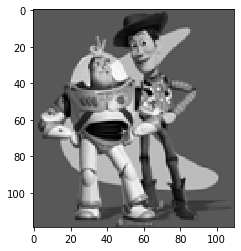

In [55]:
plt.imshow(e, cmap = 'gray')

In [56]:
im_out = toy_reconstruct(toy_img)
if im_out.any():
    print("Error is: ", np.sqrt(((im_out - toy_img)**2).sum()))

Error is:  0.00031096604802724205


### Seems to have worked well. Had trouble with the last value in the array causing a higher error but fixed by adding another variable.

## Preparation

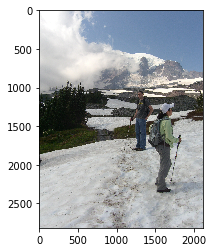

In [270]:
# Feel free to change image
background_img = cv2.cvtColor(cv2.imread('samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


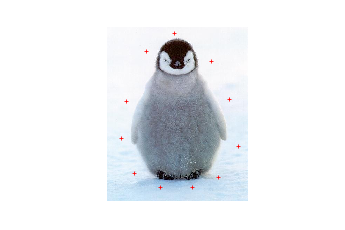

In [272]:
# Feel free to change image
object_img = cv2.cvtColor(cv2.imread('samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

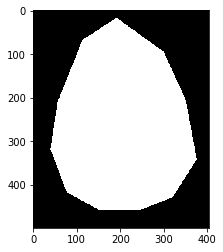

In [273]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


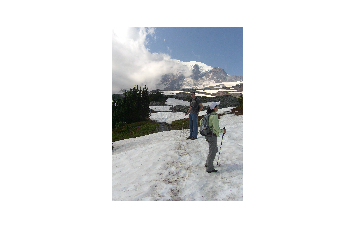

In [274]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

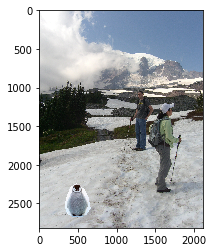

In [275]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

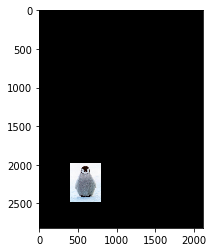

In [19]:
plt.imshow(cropped_object)

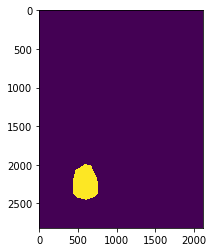

In [20]:
plt.imshow(object_mask)

In [21]:
from IPython.display import display

In [22]:
copy=np.copy(background_img)

In [23]:
display(cropped_object.shape)
display(object_mask.shape)
display(background_img.shape)
display(copy.shape)

(2816, 2112, 3)

(2816, 2112)

(2816, 2112, 3)

(2816, 2112, 3)

In [24]:
for x in range(2816):
    for y in range(2112):
        for z in range(3):
            if object_mask[x][y]:
                copy[x][y][z] = cropped_object[x][y][z]

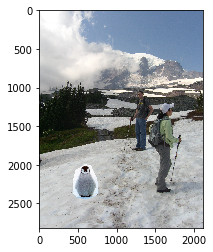

In [25]:
plt.imshow(copy)

In [39]:
im_h, im_w, im_z = cropped_object.shape 

In [37]:
im2var = np.arange(im_h * im_w).reshape(im_h, im_w)

In [3]:
def make_vals(cropped_object, object_mask, background_img):
    num_eqa = 4*(list(object_mask.flatten()).count(True))
    im_h, im_w, im_z = cropped_object.shape 
    im2var = np.arange(im_h * im_w).reshape(im_h, im_w)
    Aw=im2var[-1][-1]+1
    
    return num_eqa,im2var,Aw

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


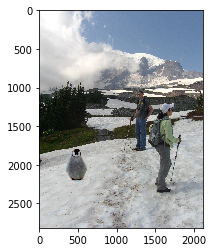

In [224]:
plt.imshow(worked)

In [4]:
def get_A(object_mask,im2var,cropped_object,background_img,z,Aw,num_eqa):
    im_h, im_w, im_z = cropped_object.shape 
    Al = lil_matrix((num_eqa, Aw))
    b=np.zeros([num_eqa])
    e=0
    for x in range(im_h):
        for y in range(im_w):
            if object_mask[x][y] and object_mask[x][y+1]:
                #print('yes',x,y,e)
                Al[e,im2var[x][y+1]]=1
                Al[e,im2var[x][y]]=-1
                b[e] = cropped_object[x][y+1][z]-cropped_object[x][y][z]
                e=e+1
            if object_mask[x][y] and not object_mask[x][y-1]:
               # print('yes',x,y,e)
                Al[e,im2var[x][y]]=1
                b[e] = cropped_object[x][y][z] - cropped_object[x][y-1][z]+background_img[x][y-1][z]
                e=e+1

            if object_mask[x][y] and object_mask[x+1][y]:
                Al[e,im2var[x+1][y]]=1
                Al[e,im2var[x][y]]=-1
                b[e] = cropped_object[x+1][y][z]-cropped_object[x][y][z]
                e=e+1
            if object_mask[x][y] and not object_mask[x-1][y]:
                Al[e,im2var[x][y]]=1
                b[e] = cropped_object[x][y][z] - cropped_object[x-1][y][z]+background_img[x-1][y][z]
                e=e+1
    return Al,b

In [5]:
def make_img(cropped_object, object_mask, background_img):
    num_eqa,im2var,Aw = make_vals(cropped_object, object_mask, background_img)
    A0,b0=get_A(object_mask,im2var,cropped_object,background_img,0,Aw,num_eqa)
    A1,b1=get_A(object_mask,im2var,cropped_object,background_img,1,Aw,num_eqa)
    A2,b2=get_A(object_mask,im2var,cropped_object,background_img,2,Aw,num_eqa)
    Al0 = lil_matrix.tocsr(A0)
    Ax0 = lsqr(Al0, b0)
    Al1 = lil_matrix.tocsr(A1)
    Ax1 = lsqr(Al1, b1)
    Al2 = lil_matrix.tocsr(A2)
    Ax2 = lsqr(Al2, b2)
    im_h, im_w, im_z = background_img.shape 
    pic1=np.zeros([im_h,im_w,3])
    x0=Ax0[0]
    x1=Ax1[0]
    x2=Ax2[0]
    e = 0
    for x in range(im_h):
        for y in range(im_w):
            
            pic1[x][y][0] = x0[e]
            pic1[x][y][1] = x1[e]
            pic1[x][y][2] = x2[e]
            e=e+1
    for x in range(im_h):
        for y in range(im_w):
            for z in range(3):
                if pic1[x][y][z]!=0:
                    background_img[x][y][z]=pic1[x][y][z]
    return background_img

In [278]:
img77=make_img(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


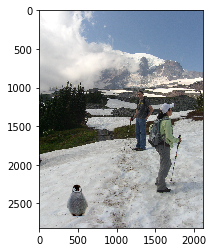

In [279]:
plt.imshow(img77)

In [295]:
np.amax(w2)

1.0

In [290]:
w2=img77

In [293]:
w2=w2/1.1896

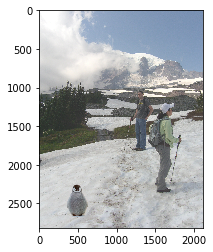

In [294]:
plt.imshow(w2)

### My test for the poisson blend seems to have worked well.

## Part 2 Poisson Blending (50 pts)

In [6]:
def poisson_blend(cropped_object, object_mask, background_img):
    """
    :param cropped_object: numpy.ndarray One you get from align_source
    :param object_mask: numpy.ndarray One you get from align_source
    :param background_img: numpy.ndarray 
    """
    img77=make_img(cropped_object, object_mask, background_img)
    return img77

In [ ]:
img22=poisson_blend(cropped_object, object_mask, background_img)

In [14]:
im_blend = poisson_blend(cropped_object, object_mask, background_img)
if im_blend.any():
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.imshow(im_blend)

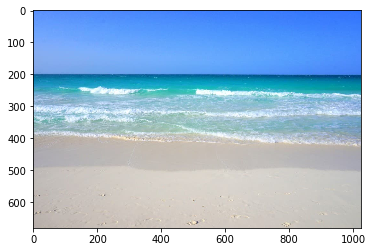

In [297]:
# Feel free to change image
background_img = cv2.cvtColor(cv2.imread('samples/beach.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


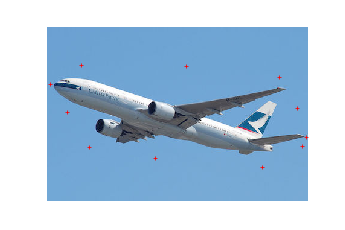

In [298]:
# Feel free to change image
object_img = cv2.cvtColor(cv2.imread('samples/777.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

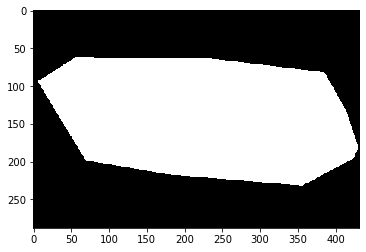

In [299]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


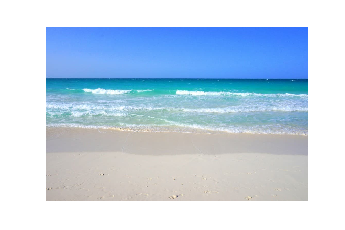

In [300]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

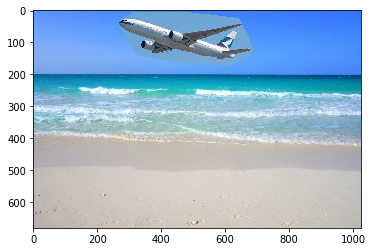

In [301]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [302]:
img777=poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


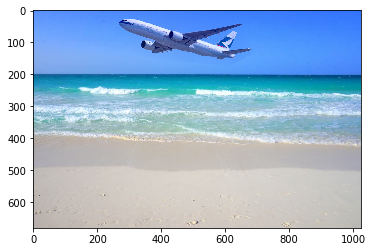

In [303]:
plt.imshow(img777)

In [304]:
w2=img777

In [307]:
np.amax(w2)

1.3048138551688098

In [308]:
w2=w2/1.30482

### The aboe seemed to blend well.

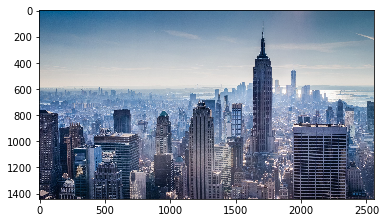

In [310]:
background_img = cv2.cvtColor(cv2.imread('samples/nyc.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


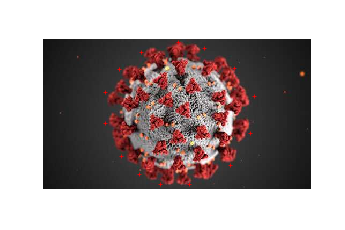

In [311]:
object_img = cv2.cvtColor(cv2.imread('samples/covid2.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

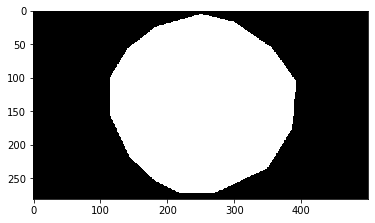

In [312]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


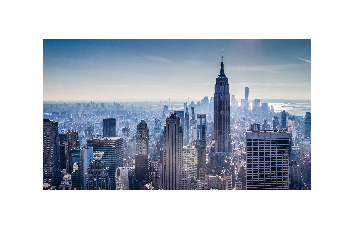

In [313]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

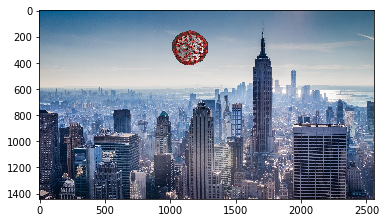

In [314]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [315]:
img_covid=poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


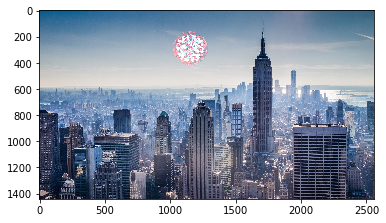

In [316]:
plt.imshow(img_covid)

In [317]:
w2=img_covid

In [319]:
np.amax(w2)

1.5677557411188725

In [320]:
w2=w2/1.568

### Here the Covid molecule ended up lighter after the poisson blend. I attribute this to the difference between the dark source image background and the lighter background image.

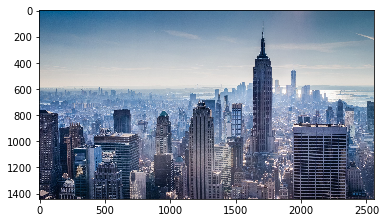

In [322]:
background_img = cv2.cvtColor(cv2.imread('samples/nyc.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


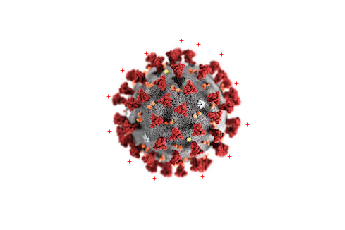

In [323]:
object_img = cv2.cvtColor(cv2.imread('samples/covid.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

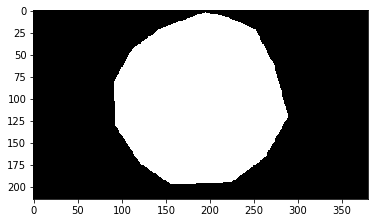

In [324]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


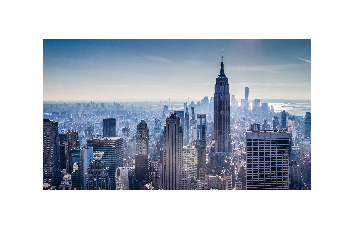

In [325]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

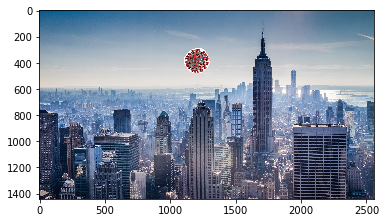

In [326]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [327]:
img_covid2=poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


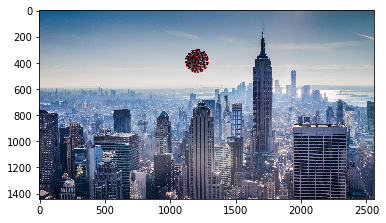

In [328]:
plt.imshow(img_covid2)

In [329]:
w2=img_covid2

In [332]:
np.amax(w2)

1.2857

In [333]:
w2=w2/1.2857

### Above we see the covid ended up much too dark, I suspect it was due to the darker background of the background image and the white background of the source image

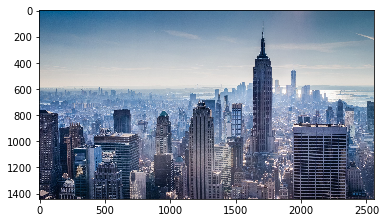

In [335]:
background_img = cv2.cvtColor(cv2.imread('samples/nyc.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


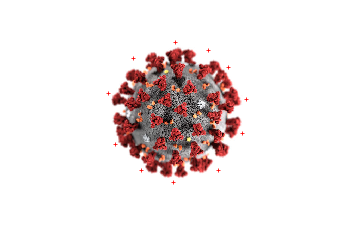

In [336]:
object_img = cv2.cvtColor(cv2.imread('samples/covid3.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

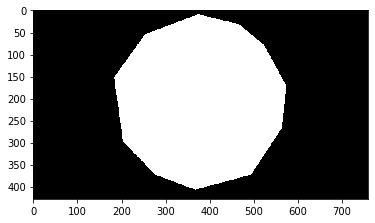

In [337]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


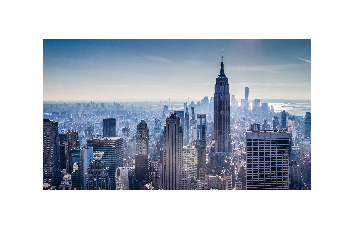

In [338]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

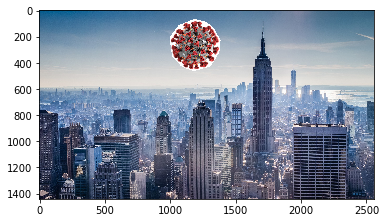

In [339]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [340]:
img_covid3=poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


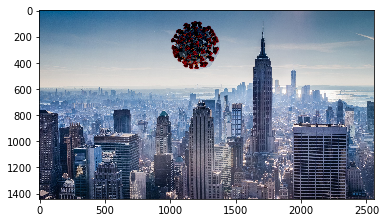

In [341]:
plt.imshow(img_covid3)

In [342]:
w2=img_covid3

In [345]:
np.amax(w2)

1.5605

In [346]:
w2=w2/1.5605

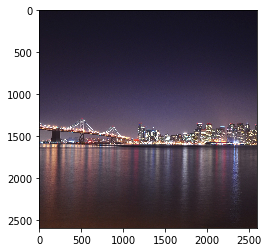

In [348]:
background_img = cv2.cvtColor(cv2.imread('samples/nyc2.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


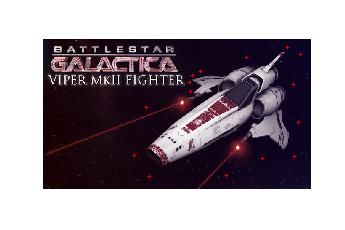

In [349]:
object_img = cv2.cvtColor(cv2.imread('samples/bsg2.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

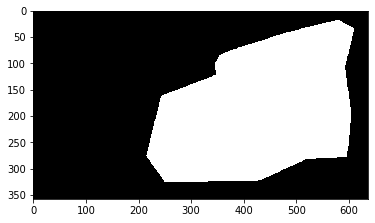

In [350]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


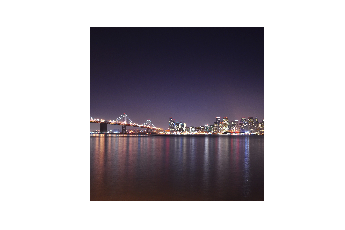

In [351]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

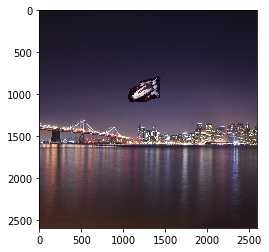

In [352]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [353]:
img_bsg=poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


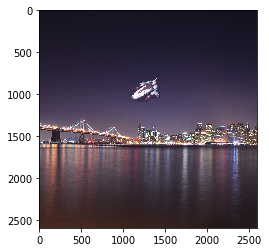

In [354]:
plt.imshow(img_bsg)

In [355]:
w2=img_bsg

In [358]:
np.max(w2)

1.2263805079786683

In [359]:
w2=w2/1.227

In [91]:
im_h, im_w, im_z = cropped_object.shape 

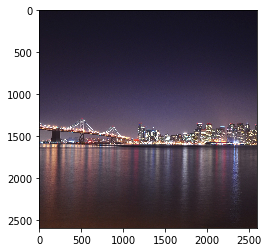

In [361]:
background_img = cv2.cvtColor(cv2.imread('samples/nyc2.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


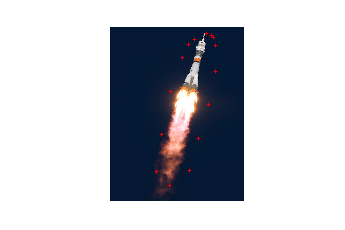

In [362]:
object_img = cv2.cvtColor(cv2.imread('samples/rocket.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

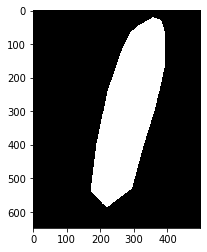

In [363]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


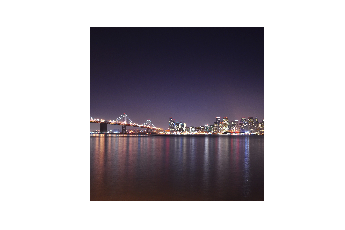

In [364]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

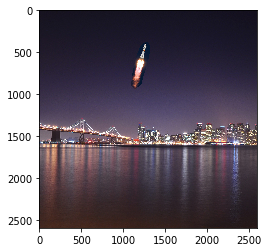

In [365]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [366]:
img_rocket=poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


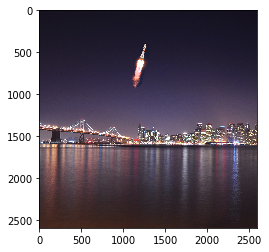

In [367]:
plt.imshow(img_rocket)

In [368]:
w2=img_rocket

In [371]:
np.amax(w2)

1.1404853999002462

In [372]:
w2=w2/1.1405

### So I was able to get the poisson blen working very well and over all was happy with the results.

## Part 3 Mixed Gradients (20 pts)

In [168]:
def get_At(object_mask,im2var,cropped_object,background_img,z,Aw,num_eqa):
    im_h, im_w, im_z = cropped_object.shape 
    Al = lil_matrix((num_eqa, Aw))
    Al1 = lil_matrix((num_eqa, Aw))
    Al2 = lil_matrix((num_eqa, Aw))
    b=np.zeros([num_eqa])
    b1=np.zeros([num_eqa])
    b2=np.zeros([num_eqa])
    e=0
    for x in range(im_h):
        for y in range(im_w):
            if object_mask[x][y] and object_mask[x][y+1]:
                for z in range(3):
                    if z == 0:
                        Al[e,im2var[x][y+1]]=1
                        Al[e,im2var[x][y]]=-1
                        Ax = cropped_object[x][y+1][z]-cropped_object[x][y][z]
                        Tx = background_img[x][y+1][z] - background_img[x][y][z]
                    if z ==1:
                        Al1[e,im2var[x][y+1]]=1
                        Al1[e,im2var[x][y]]=-1
                        Ax1 = cropped_object[x][y+1][z]-cropped_object[x][y][z]
                        Tx1 = background_img[x][y+1][z] - background_img[x][y][z]
                    if z == 2:
                        Al2[e,im2var[x][y+1]]=1
                        Al2[e,im2var[x][y]]=-1
                        Ax2 = cropped_object[x][y+1][z]-cropped_object[x][y][z]
                        Tx2 = background_img[x][y+1][z] - background_img[x][y][z]
                    
                
                #print('yes',x,y,e)
#                 Al[e,im2var[x][y+1]]=1
#                 Al[e,im2var[x][y]]=-1
#                 Ax = cropped_object[x][y+1][z]-cropped_object[x][y][z]
#                 Tx = background_img[x][y+1][z] - background_img[x][y][z]
                Axa, Txa = abs(Ax+Ax1+Ax2),abs(Tx+Tx1+Tx2)
                if Axa>Txa:
                    b[e]=Ax
                    b1[e]=Ax1
                    b2[e]=Ax2
                else:
                    b[e]=Tx
                    b1[e]=Tx1
                    b2[e]=Tx2
#                b[e]=max(abs(Ax),abs(Tx))
                e= e+1
                
            if object_mask[x][y] and not object_mask[x][y-1]:
                for z in range(3):
                    if z == 0:
                        Al[e,im2var[x][y]]=1
                        Ax = cropped_object[x][y][z] - cropped_object[x][y-1][z]+background_img[x][y-1][z]
                        Tx = background_img[x][y][z] #- background_img[x][y-1][z]+cropped_object[x][y-1][z]
                    if z == 1:
                        Al1[e,im2var[x][y]]=1
                        Ax1 = cropped_object[x][y][z] - cropped_object[x][y-1][z]+background_img[x][y-1][z]
                        Tx1 = background_img[x][y][z] #- background_img[x][y-1][z]+cropped_object[x][y-1][z]
                    if z ==2:
                        Al2[e,im2var[x][y]]=1
                        Ax2 = cropped_object[x][y][z] - cropped_object[x][y-1][z]+background_img[x][y-1][z]
                        Tx2 = background_img[x][y][z] #- background_img[x][y-1][z]+cropped_object[x][y-1][z]
                Axa, Txa = abs(Ax+Ax1+Ax2),abs(Tx+Tx1+Tx2)
                if Axa>Txa:
                    b[e]=Ax
                    b1[e]=Ax1
                    b2[e]=Ax2
                else:
                    b[e]=Tx
                    b1[e]=Tx1
                    b2[e]=Tx2
                e=e+1

            if object_mask[x][y] and object_mask[x+1][y]:
                for z in range(3):
                    if z == 0:
                        Al[e,im2var[x+1][y]]=1
                        Al[e,im2var[x][y]]=-1
                        Ax = cropped_object[x+1][y][z]-cropped_object[x][y][z]
                        Tx = background_img[x+1][y][z] - background_img[x][y][z]
                    if z ==1:
                        Al1[e,im2var[x+1][y]]=1
                        Al1[e,im2var[x][y]]=-1
                        Ax1 = cropped_object[x+1][y][z]-cropped_object[x][y][z]
                        Tx1 = background_img[x+1][y][z] - background_img[x][y][z]
                    if z == 2:
                        Al2[e,im2var[x+1][y]]=1
                        Al2[e,im2var[x][y]]=-1
                        Ax2 = cropped_object[x+1][y][z]-cropped_object[x][y][z]
                        Tx2 = background_img[x+1][y][z] - background_img[x][y][z]
                Axa, Txa = abs(Ax+Ax1+Ax2),abs(Tx+Tx1+Tx2)
                if Axa>Txa:
                    b[e]=Ax
                    b1[e]=Ax1
                    b2[e]=Ax2
                else:
                    b[e]=Tx
                    b1[e]=Tx1
                    b2[e]=Tx2
        
        
        
        
#                 Al[e,im2var[x+1][y]]=1
#                 Al[e,im2var[x][y]]=-1
#                 Ax = cropped_object[x+1][y][z]-cropped_object[x][y][z]
#                 Tx = background_img[x+1][y][z] - background_img[x][y][z]
#                 Axa, Txa = abs(Ax),abs(Tx)
#                 if Axa>Txa:
#                     b[e]=Ax
#                 else:
#                     b[e]=Tx
#                 b[e]=max(abs(Ax),abs(Tx))
                e=e+1
            if object_mask[x][y] and not object_mask[x-1][y]:
                 for z in range(3):
                    if z == 0:
                        Al[e,im2var[x][y]]=1
                        Ax = cropped_object[x][y][z] - cropped_object[x-1][y][z]+background_img[x-1][y][z]
                        Tx = background_img[x][y][z] #- background_img[x-1][y][z]+cropped_object[x-1][y][z]
                    if z == 1:
                        Al1[e,im2var[x][y]]=1
                        Ax1 = cropped_object[x][y][z] - cropped_object[x-1][y][z]+background_img[x-1][y][z]
                        Tx1 = background_img[x][y][z] #- background_img[x-1][y][z]+cropped_object[x-1][y][z]
                    if z ==2:
                        Al2[e,im2var[x][y]]=1
                        Ax2 = cropped_object[x][y][z] - cropped_object[x-1][y][z]+background_img[x-1][y][z]
                        Tx2 = background_img[x][y][z] #- background_img[x-1][y][z]+cropped_object[x-1][y][z]
                 Axa, Txa = abs(Ax+Ax1+Ax2),abs(Tx+Tx1+Tx2)
                 if Axa>Txa:
                    b[e]=Ax
                    b1[e]=Ax1
                    b2[e]=Ax2
                 else:
                    b[e]=Tx
                    b1[e]=Tx1
                    b2[e]=Tx2
#                 Al[e,im2var[x][y]]=1
#                 Ax = cropped_object[x][y][z] - cropped_object[x-1][y][z]+background_img[x][y][z]
#                 Tx = background_img[x][y][z] - background_img[x][y-1][z]+cropped_object[x][y-1][z]
#                 b[e]=max(abs(Ax),abs(Tx))
#                 e=e+1
    return Al,Al1,Al2,b,b1,b2

In [102]:
def make_imgt(cropped_object, object_mask, background_img):
    num_eqa,im2var,Aw = make_vals(cropped_object, object_mask, background_img)
    A0,A1,A2,b0,b1,b2=get_At(object_mask,im2var,cropped_object,background_img,0,Aw,num_eqa)
#     A1,b1=get_At(object_mask,im2var,cropped_object,background_img,1,Aw,num_eqa)
#     A2,b2=get_At(object_mask,im2var,cropped_object,background_img,2,Aw,num_eqa)
    Al0 = lil_matrix.tocsr(A0)
    Ax0 = lsqr(Al0, b0)
    Al1 = lil_matrix.tocsr(A1)
    Ax1 = lsqr(Al1, b1)
    Al2 = lil_matrix.tocsr(A2)
    Ax2 = lsqr(Al2, b2)
    im_h, im_w, im_z = background_img.shape 
    pic1=np.zeros([im_h,im_w,3])
    x0=Ax0[0]
    x1=Ax1[0]
    x2=Ax2[0]
    e = 0
    for x in range(im_h):
        for y in range(im_w):
            
            pic1[x][y][0] = x0[e]
            pic1[x][y][1] = x1[e]
            pic1[x][y][2] = x2[e]
            e=e+1
    for x in range(im_h):
        for y in range(im_w):
            for z in range(3):
                if pic1[x][y][z]!=0:
                    background_img[x][y][z]=pic1[x][y][z]
    return background_img

In [94]:
def get_At1(object_mask,im2var,cropped_object,background_img,z,Aw,num_eqa):
    im_h, im_w, im_z = cropped_object.shape 
    Al = lil_matrix((num_eqa, Aw))
    Al1 = lil_matrix((num_eqa, Aw))
    Al2 = lil_matrix((num_eqa, Aw))
    b=np.zeros([num_eqa])
    e=0
    for x in range(im_h):
        for y in range(im_w):
            if object_mask[x][y] and object_mask[x][y+1]:
               
                
                #print('yes',x,y,e)
                Al[e,im2var[x][y+1]]=1
                Al[e,im2var[x][y]]=-1
                Ax = cropped_object[x][y+1][z]-cropped_object[x][y][z]
                Tx = background_img[x][y+1][z] - background_img[x][y][z]
                Axa, Txa = abs(Ax),abs(Tx)
                if Axa>Txa:
                    b[e]=Ax
                else:
                    b[e]=Tx
#                b[e]=max(abs(Ax),abs(Tx))
                e= e+1
#             if object_mask[x][y] and not object_mask[x][y-1]:
#                # print('yes',x,y,e)
#                 Al[e,im2var[x][y]]=1
#                 Ax = cropped_object[x][y][z] - cropped_object[x][y-1][z]+background_img[x][y-1][z]
#                 Tx = background_img[x][y][z] - background_img[x][y-1][z]+cropped_object[x][y-1][z]
#                 b[e]=max(abs(Ax),abs(Tx))
#                 e=e+1

            if object_mask[x][y] and object_mask[x+1][y]:
                Al[e,im2var[x+1][y]]=1
                Al[e,im2var[x][y]]=-1
                Ax = cropped_object[x+1][y][z]-cropped_object[x][y][z]
                Tx = background_img[x+1][y][z] - background_img[x][y][z]
                Axa, Txa = abs(Ax),abs(Tx)
                if Axa>Txa:
                    b[e]=Ax
                else:
                    b[e]=Tx
#                 b[e]=max(abs(Ax),abs(Tx))
                e=e+1
#             if object_mask[x][y] and not object_mask[x-1][y]:
#                 Al[e,im2var[x][y]]=1
#                 Ax = cropped_object[x][y][z] - cropped_object[x-1][y][z]+background_img[x][y][z]
#                 Tx = background_img[x][y][z] - background_img[x][y-1][z]+cropped_object[x][y-1][z]
#                 b[e]=max(abs(Ax),abs(Tx))
#                 e=e+1
    return Al,b

In [4]:
def make_imgt1(cropped_object, object_mask, background_img):
    num_eqa,im2var,Aw = make_vals(cropped_object, object_mask, background_img)
    A0,b0=get_At1(object_mask,im2var,cropped_object,background_img,0,Aw,num_eqa)
    A1,b1=get_At1(object_mask,im2var,cropped_object,background_img,1,Aw,num_eqa)
    A2,b2=get_At1(object_mask,im2var,cropped_object,background_img,2,Aw,num_eqa)
    Al0 = lil_matrix.tocsr(A0)
    Ax0 = lsqr(Al0, b0)
    Al1 = lil_matrix.tocsr(A1)
    Ax1 = lsqr(Al1, b1)
    Al2 = lil_matrix.tocsr(A2)
    Ax2 = lsqr(Al2, b2)
    im_h, im_w, im_z = background_img.shape 
    pic1=np.zeros([im_h,im_w,3])
    x0=Ax0[0]
    x1=Ax1[0]
    x2=Ax2[0]
    e = 0
    for x in range(im_h):
        for y in range(im_w):
            
            pic1[x][y][0] = x0[e]
            pic1[x][y][1] = x1[e]
            pic1[x][y][2] = x2[e]
            e=e+1
    for x in range(im_h):
        for y in range(im_w):
            for z in range(3):
                if pic1[x][y][z]!=0:
                    background_img[x][y][z]=pic1[x][y][z]
    return background_img

In [70]:
def make_imgbw(cropped_object, object_mask, background_img):
    """Attempt at doing grayscale for mix_blend transfer"""
    
    
    num_eqa,im2var,Aw = make_vals(cropped_object, object_mask, background_img)
    A0,b0=get_At(object_mask,im2var,cropped_object,background_img,0,Aw,num_eqa)
    
    Al0 = lil_matrix.tocsr(A0)
    Ax0 = lsqr(Al0, b0)
    
    im_h, im_w, im_z = background_img.shape 
    pic1=np.zeros([im_h,im_w])
    x0=Ax0[0]
    
    e = 0
    for x in range(im_h):
        for y in range(im_w):
            
            pic1[x][y] = x0[e]
            
            e=e+1
    for x in range(im_h):
        for y in range(im_w):
            
            if pic1[x][y]!=0:
                background_img[x][y]=pic1[x][y]
    return background_img

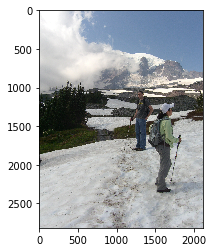

In [110]:
# Feel free to change image
background_img = cv2.cvtColor(cv2.imread('samples/im2.JPG'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


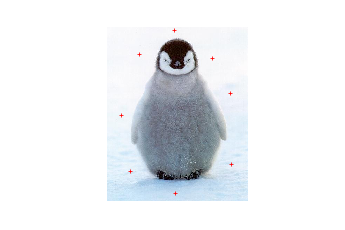

In [111]:
object_img = cv2.cvtColor(cv2.imread('samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

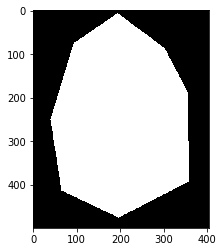

In [112]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


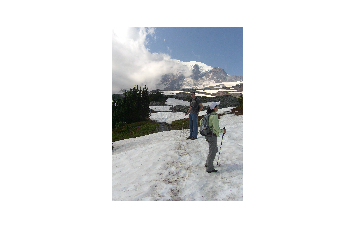

In [113]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

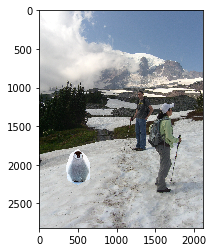

In [114]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [120]:
imgAt=make_imgt(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


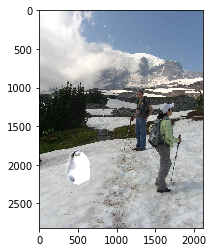

In [122]:
plt.imshow(imgAt)

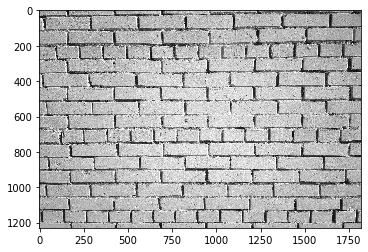

In [73]:
background_img = cv2.cvtColor(cv2.imread('samples/wall.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


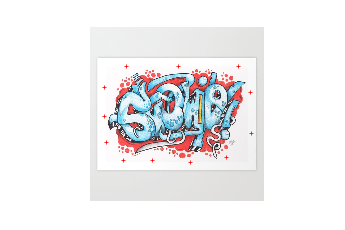

In [74]:
object_img = cv2.cvtColor(cv2.imread('samples/graf.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

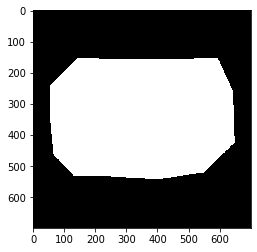

In [75]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


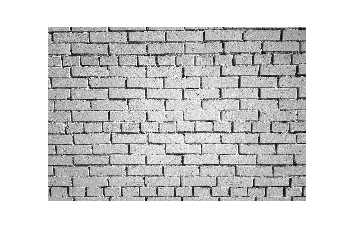

In [76]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

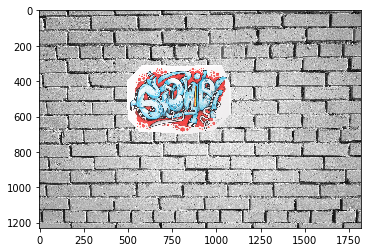

In [77]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

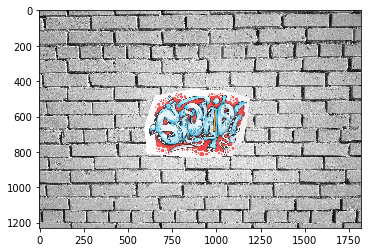

In [46]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [47]:
imggraf=mix_blend(cropped_object, object_mask, background_img)

In [48]:
imggra=poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


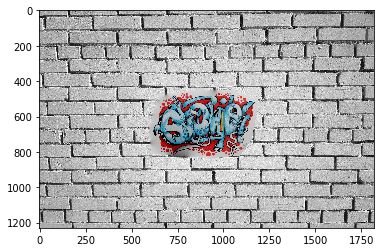

In [49]:
plt.imshow(imggraf, aspect = 'auto')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


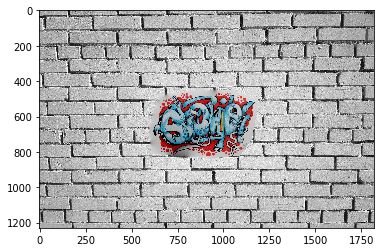

In [50]:
plt.imshow(imggra, aspect = 'auto')

## Above we have mix_blend vs poisson blend, the poisson blend seems a tad bit darker, but they are pretty much the same. Will modify code and try again!

In [27]:
imggraf=make_imgt(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


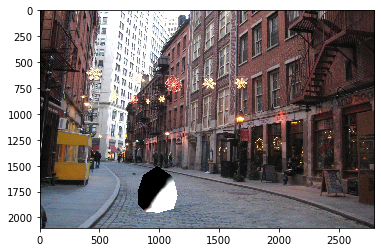

In [39]:
plt.imshow(imggraf, aspect='auto')

### Hmmm, the mix blend is still not giving a decent result. I will try the same variables withthe poisson blend and see what happens and changing the mix_blend.

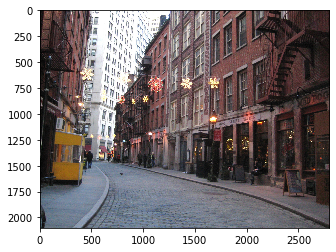

In [7]:
background_img = cv2.cvtColor(cv2.imread('samples/street.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


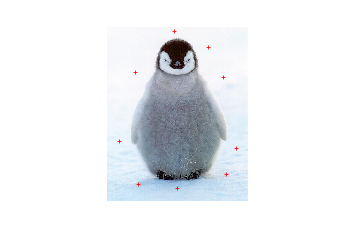

In [9]:
object_img = cv2.cvtColor(cv2.imread('samples/penguin-chick.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

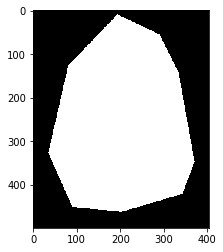

In [10]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


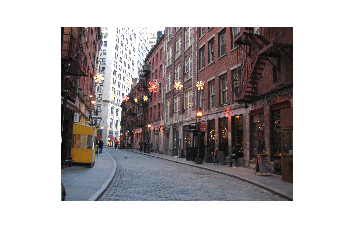

In [11]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

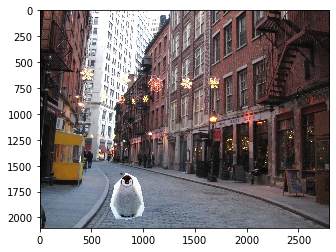

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [ ]:
imgstreet=make_img(cropped_object, object_mask, background_img)

In [ ]:
plt.imshow(imgstreet, aspect='auto')

In [57]:
imgstreett = mix_blend(cropped_object, object_mask, background_img)

In [384]:
w2=imgstreet

In [387]:
np.amax(w2)

1.456

In [388]:
w2=w2/1.456

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


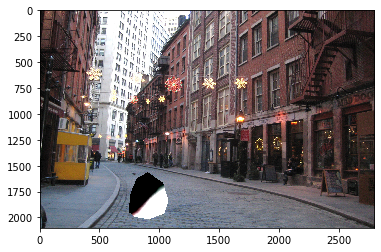

In [58]:
plt.imshow(imgstreett, aspect='auto')

In [79]:
imggraf2 = mix_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


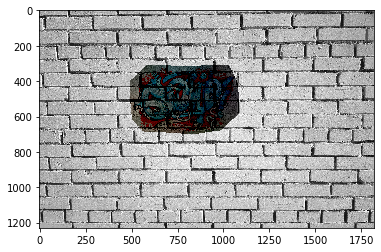

In [80]:
plt.imshow(imggraf2, aspect='auto')

## I can see the texture but the colors are too dark.

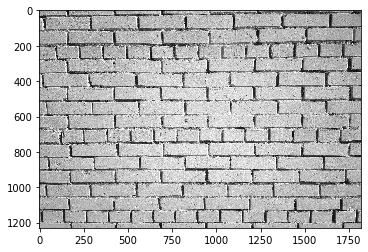

In [255]:
background_img = cv2.cvtColor(cv2.imread('samples/wall.jpeg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
plt.figure()
plt.imshow(background_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


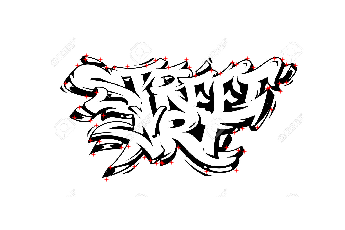

In [257]:
object_img = cv2.cvtColor(cv2.imread('samples/graf5.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

If it doesn't get you to the drawing mode, then rerun this function again.


<IPython.core.display.Javascript object>


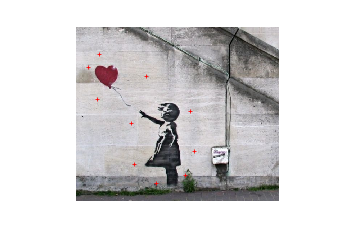

In [104]:
object_img = cv2.cvtColor(cv2.imread('samples/graf4.jpg'), cv2.COLOR_BGR2RGB).astype('double') / 255.0 
import matplotlib.pyplot as plt
%matplotlib notebook
mask_coords = specify_mask(object_img)

<Figure size 432x288 with 0 Axes>

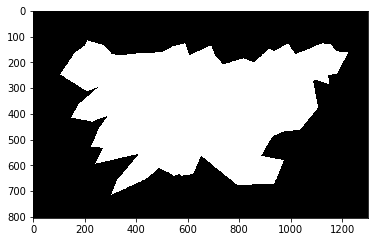

In [258]:
xs = mask_coords[0]
ys = mask_coords[1]
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure()
mask = get_mask(ys, xs, object_img)

If it doesn't get you to the drawing mode, then rerun this function again. Also, make sure the object fill fit into the background image. Otherwise it will crash


<IPython.core.display.Javascript object>


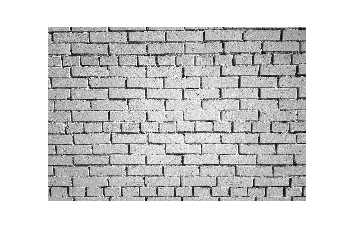

In [259]:
%matplotlib notebook
import matplotlib.pyplot as plt
bottom_center = specify_bottom_center(background_img)

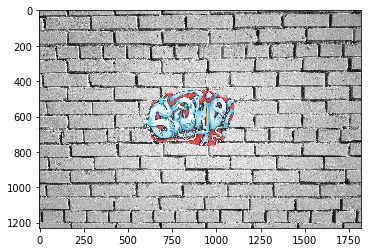

In [241]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

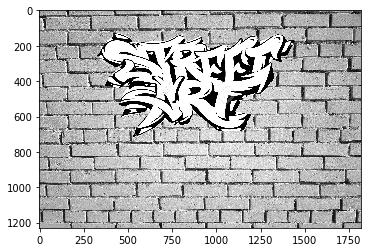

In [260]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

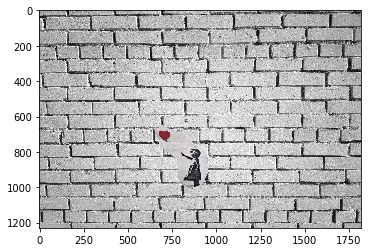

In [109]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

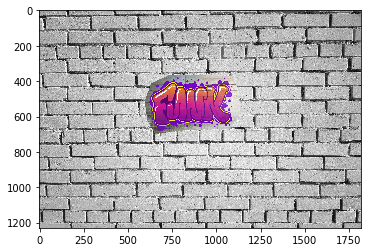

In [86]:
%matplotlib inline
import matplotlib.pyplot as plt
cropped_object, object_mask = align_source(object_img, mask, background_img, bottom_center)

In [87]:
imggraf3 = mix_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


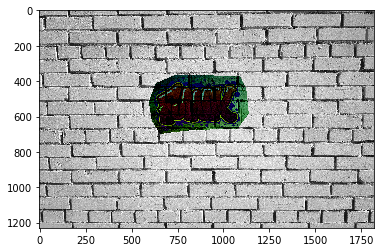

In [89]:
plt.imshow(imggraf3, aspect='auto')

In [92]:
imggraf4 = mix_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


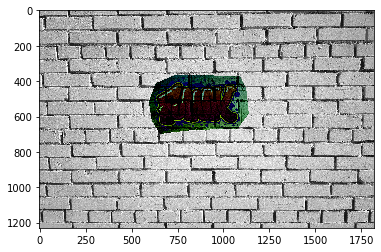

In [93]:
plt.imshow(imggraf4, aspect='auto')

In [110]:
imggraf5 = mix_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


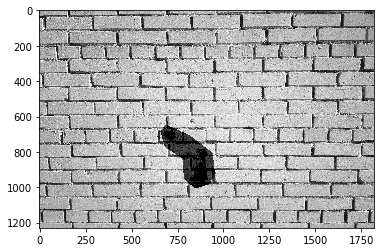

In [111]:
plt.imshow(imggraf5, aspect='auto')

In [127]:
imgrules = mix_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


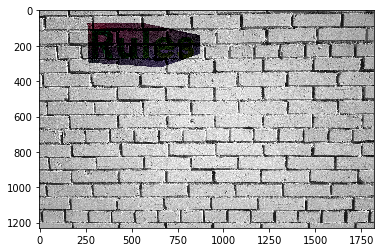

In [128]:
plt.imshow(imgrules, aspect='auto')

In [133]:
imgrules2 = poisson_blend(cropped_object, object_mask, background_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


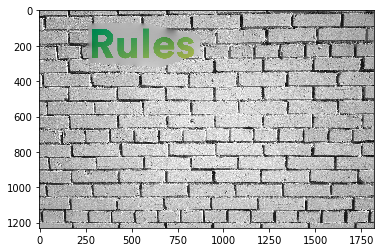

In [134]:
plt.imshow(imgrules2, aspect='auto')

## At this point I could not get mix_blend to work perfectly. I could either get the same result as myb poisson_blend or a result very similar. Or I could get a result that showed the underlaying texture but the colors would be too dark. I tried so many variations, taking abs's, using graysale gradients, doing the gradients individually, totallying the gradients. It generally left me with result of showing the back texture but the colors being too dark.

In [11]:
def mix_blend(cropped_object, object_mask, background_img):
    """
    :param cropped_object: numpy.ndarray One you get from align_source
    :param object_mask: numpy.ndarray One you get from align_source
    :param background_img: numpy.ndarray 
    """
    img=make_imgt(cropped_object, object_mask, background_img)
    return img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


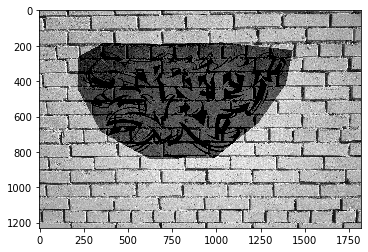

In [149]:
im_mix = mix_blend(cropped_object, object_mask, background_img)
if im_mix.any():
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.imshow(im_mix)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


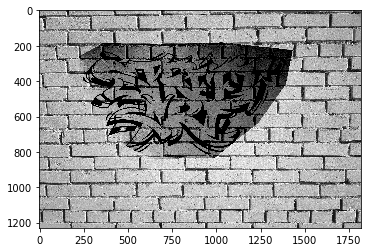

In [165]:
im_mix = mix_blend(cropped_object, object_mask, background_img)
if im_mix.any():
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.imshow(im_mix)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


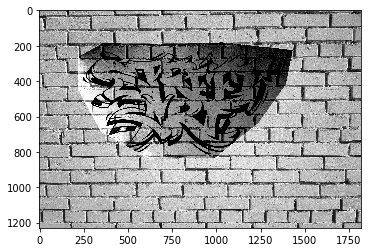

In [167]:
im_mix2 = mix_blend(cropped_object, object_mask, background_img)
if im_mix.any():
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.imshow(im_mix2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


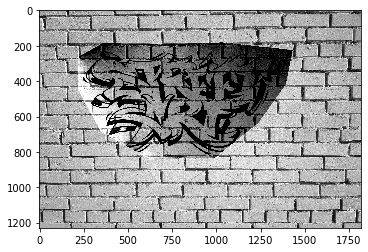

In [169]:
im_mix3 = mix_blend(cropped_object, object_mask, background_img)
if im_mix.any():
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.imshow(im_mix2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


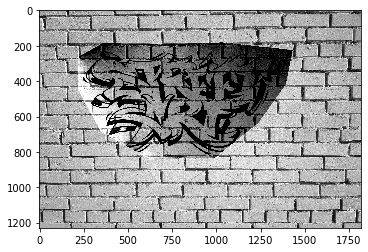

In [170]:
plt.imshow(im_mix3)

In [183]:
np.amin(er)

-1.2228318785236125

In [184]:
err = abs(im_mix3)

In [187]:
errr=im_mix3

In [188]:
errr.shape

(1230, 1820, 3)

In [189]:
wer=np.zeros([1230, 1820, 3])

In [190]:
for x in range(1230):
    for y in range(1820):
        for z in range(3):
            if errr[x][y][z] < 0:
                wer[x][y][z] = 0
            if errr[x][y][z] > 1:
                wer[x][y][z] =1
            else:
                wer[x][y][z] = errr[x][y][z]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


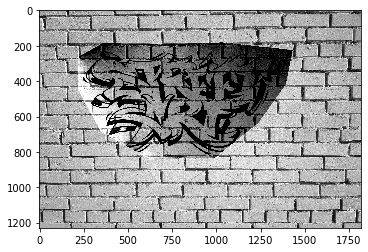

In [191]:
plt.imshow(wer)

In [192]:
e1=err/1.64

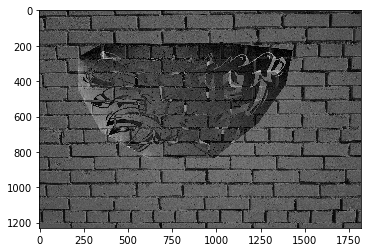

In [198]:
plt.imshow(e2)

In [179]:
er=im_mix3/1.634

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


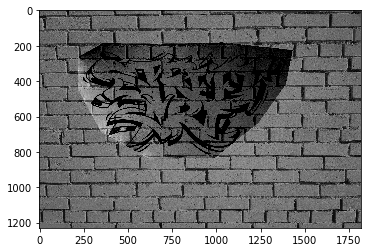

In [186]:
plt.imshow(er)

In [226]:
np.amax(e3)

3.6334018848397873

In [196]:
e2=e1/1.22

In [201]:
w1 = np.zeros([1230, 1820, 3])

In [203]:
for x in range(1230):
    for y in range(1820):
        for z in range(3):
            if wer[x][y][z] < 0:
                w1[x][y][z] = 0
            
            else:
                w1[x][y][z] = wer[x][y][z]

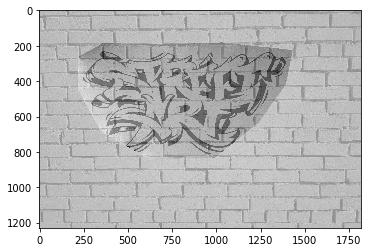

In [228]:
plt.imshow(e3)

In [207]:
w2=w1/1.64

In [222]:
e3 = im_mix2

In [227]:
e3=e3/3.634

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


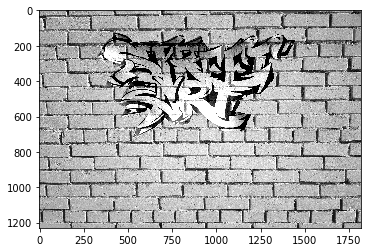

In [261]:
im_mix5 = mix_blend(cropped_object, object_mask, background_img)
if im_mix.any():
    %matplotlib inline
    import matplotlib.pyplot as plt
    plt.imshow(im_mix5)

In [262]:
w2=im_mix5

In [265]:
np.amax(w2)

3.2979105671745628

In [390]:
w2=w2/1.2

In [391]:
plt.imsave('peng3.jpg', w2)

# Bells & Whistles (Extra Points)

## Color2Gray (20 pts)

In [17]:
def color2gray(img):
    pass

## Laplacian pyramid blending (20 pts)

In [18]:
def laplacian_blend(img1, img2):
    pass

## More gradient domain processing (up to 20 pts)